In [1]:
import matplotlib as plt
import scanpy as sc
import pandas as pd
import numpy as np
import os

In [10]:
adata = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet.h5ad")

In [4]:
adata = adata[adata.obs['batch'] != '20230925'].copy()

In [5]:
adata

AnnData object with n_obs × n_vars = 734956 × 17893
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'leiden_res_4.00_main', 'leiden_res_0.60_main', 'leiden_res_0.10_main', 'leiden_res_0.03_main', 'leiden_res_8.00_main', 'UMAP_1', 'UMAP_2', 'leiden_res_2.00_main', 'all_celltype', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_4.00_neuron

In [3]:
sc.set_figure_params(dpi = 100)

In [27]:
import matplotlib.pyplot as plt

# Calculate percentages
cell_percentages = cell_counts.div(cell_counts.sum(axis=1), axis=0) * 100

# Create two stacked plots vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 14), gridspec_kw={'height_ratios': [1, 1]})

# First plot (Number of Cells)
cell_counts.plot(
    kind='bar',
    stacked=True,
    color=colors,
    width=0.8,
    ax=ax1,
    legend=False  # turn off individual legend
)

ax1.set_ylabel('Number of Cells', fontsize=12)
ax1.set_xlabel('')
ax1.set_title('Cell Type Composition by Condition (Counts)', fontsize=14)
ax1.tick_params(axis='x', rotation=90, labelsize=6)

# Second plot (Percentage of Cells)
cell_percentages.plot(
    kind='bar',
    stacked=True,
    color=colors,
    width=0.8,
    ax=ax2,
    legend=False  # turn off individual legend
)

ax2.set_ylabel('Percentage (%)', fontsize=12)
ax2.set_xlabel('Conditions', fontsize=12)
ax2.set_title('Cell Type Composition by Condition (Percentages)', fontsize=14)
ax2.tick_params(axis='x', rotation=90, labelsize=6)

# Create a single legend box for both plots on the right side
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, title='Cell Types', bbox_to_anchor=(1.02, 0.5), 
           loc='center left', fontsize=9, title_fontsize=10, ncol=2)

plt.tight_layout(rect=[0, 0, 0.98, 1])  # Adjust layout to make room for legend
plt.show()


In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
del adata.uns['log1p']
sc.tl.rank_genes_groups(adata, groupby="all_celltype", method="wilcoxon")

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a futur

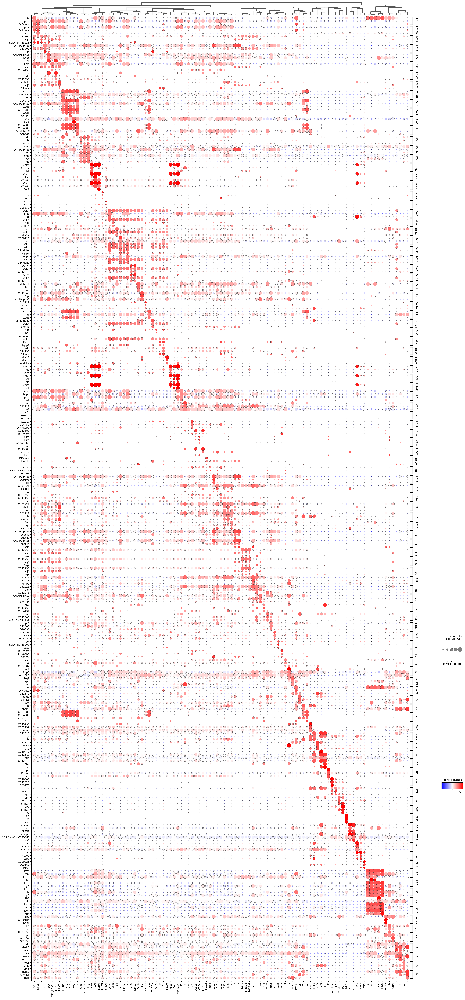

In [141]:
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 10})
# 1) Create the dotplot with swap_axes=True and dendrogram, but do NOT show it yet
axes_dict = sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    figsize=(25, 60),
    #dot_max=0.5,
    dendrogram=True,
    swap_axes=True,
    show=False,
)

# 2) Extract the axes we need
main_ax = axes_dict['mainplot_ax']
size_legend_ax = axes_dict['size_legend_ax']
color_legend_ax = axes_dict['color_legend_ax']

row_dendro_ax = axes_dict.get('row_dendrogram_ax', None)
col_dendro_ax = axes_dict.get('col_dendrogram_ax', None)

# 3) Position main plot/dendrogram (example)
if row_dendro_ax is not None:
    # If the dendrogram is on the left or right
    row_dendro_ax.set_position([0.02, 0.1, 0.06, 0.75])
    main_ax.set_position([0.09, 0.1, 0.85, 0.75])
elif col_dendro_ax is not None:
    # If the dendrogram is on the top or bottom
    col_dendro_ax.set_position([0.05, 0.88, 0.9, 0.10])
    main_ax.set_position([0.05, 0.10, 0.9, 0.75])

# 4) Reposition legends (example on the right)
size_legend_ax.set_position([0.95, 0.4, 0.04, 0.03])
color_legend_ax.set_position([0.95, 0.3, 0.04, 0.005])

# 5) Finally, show the figure
plt.show()


In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
del adata.uns['log1p']

sc.tl.rank_genes_groups(
    adata,
    groupby=groupby,
    reference='rest',
    method='t-test',
    use_raw=False,
    layer=layer,
    tie_correct=True,       # safer with many ties
    corr_method='benjamini-hochberg',
    key_added='markers'
)


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.sparse as sp
import re

groupby = "all_celltype"   # set this to your column
key     = "markers"        # because you used key_added='markers' above

# --- 1) Pull DE results (fix: no positional after keyword) ---
# sc.get.rank_genes_groups_df(adata, group=None, key='markers')
df = sc.get.rank_genes_groups_df(adata, group=None, key=key)

# Harmonize column names
colmap = {
    'group':'cell_type', 'names':'gene', 'logfoldchanges':'log2fc',
    'pvals_adj':'padj', 'pvals':'pval', 'scores':'score'
}
df = df.rename(columns={k:v for k,v in colmap.items() if k in df.columns})

# --- 2) Detection fractions (use Scanpy if present; else compute) ---
rg = adata.uns[key]
have_pts = ('pts' in rg) and ('pts_rest' in rg)

if have_pts:
    # Scanpy-provided detection fractions
    groups = list(rg['names'].dtype.names)  # column names in recarray
    pts      = pd.DataFrame(rg['pts'],      columns=groups)
    pts_rest = pd.DataFrame(rg['pts_rest'], columns=groups)
    pts.index = rg['names'].view(dtype=object)[:,0]  # gene names
    pts_rest.index = pts.index

else:
    # Manual computation of pct_in / pct_out per group on the current matrix
    X = adata.X if adata.is_view is False else adata.copy().X
    if key in adata.layers:
        X = adata.layers[key]
    cats = adata.obs[groupby].astype('category')
    groups = list(cats.cat.categories)

    # binarize
    if sp.issparse(X):
        X_bin = X.tocsc(copy=True)
        X_bin.data = (X_bin.data > 0).astype(np.int8)
    else:
        X_bin = (X > 0).astype(np.int8)

    pts_dict, pts_rest_dict = {}, {}
    for g in groups:
        mask = (cats == g).values
        n_in = int(mask.sum())
        n_out = int((~mask).sum())

        if sp.issparse(X_bin):
            in_count  = X_bin[mask].sum(axis=0).A1 if n_in > 0 else np.zeros(X_bin.shape[1])
            out_count = X_bin[~mask].sum(axis=0).A1 if n_out > 0 else np.zeros(X_bin.shape[1])
        else:
            in_count  = X_bin[mask].sum(axis=0) if n_in > 0 else np.zeros(X_bin.shape[1])
            out_count = X_bin[~mask].sum(axis=0) if n_out > 0 else np.zeros(X_bin.shape[1])

        pts_dict[g]      = (in_count  / max(n_in, 1))
        pts_rest_dict[g] = (out_count / max(n_out, 1))

    pts      = pd.DataFrame(pts_dict,      index=adata.var_names)
    pts_rest = pd.DataFrame(pts_rest_dict, index=adata.var_names)

# Ensure we have a 'gene' column after reset_index()
pts.index.name = 'gene'
pts_rest.index.name = 'gene'

pts_long = pts.reset_index().melt(id_vars='gene', var_name='cell_type', value_name='pct_in')
pts_rest_long = pts_rest.reset_index().melt(id_vars='gene', var_name='cell_type', value_name='pct_out')

# Melt + merge into df
pts_long = pts.reset_index().melt(id_vars='index', var_name='cell_type', value_name='pct_in').rename(columns={'index':'gene'})
pts_rest_long = pts_rest.reset_index().melt(id_vars='index', var_name='cell_type', value_name='pct_out').rename(columns={'index':'gene'})
df = (df.merge(pts_long, on=['cell_type','gene'], how='left')
        .merge(pts_rest_long, on=['cell_type','gene'], how='left'))

# --- 3) Filter out “junk” genes (ribo/mt/small RNAs, etc.) ---
junk_re = re.compile(r'^(Rp[LS]\d+|mt:)|^(sno|snr|snrna|snord|mir-)|^tRNA|rRNA|^7SLRNA$|^7SK$|^U6$', re.IGNORECASE)
df = df[~df['gene'].str.match(junk_re, na=False)].copy()

# --- 4) Meaningfulness filters + ranking ---
for c in ['pct_in','pct_out','log2fc','padj']:
    if c not in df: df[c] = np.nan
df[['pct_in','pct_out']] = df[['pct_in','pct_out']].fillna(0.0)

flt = (
    (df['padj'] < 0.05) &
    (df['log2fc'] >= 0.5) &
    (df['pct_in'] >= 0.25) &
    ((df['pct_in'] - df['pct_out']) >= 0.20)
)
df_filt = df.loc[flt].copy()

df_filt['specificity'] = df_filt['log2fc'] * (df_filt['pct_in'] - df_filt['pct_out'])
df_filt['rank_score'] = (
    0.7*df_filt['specificity'] +
    (0.3*df_filt['score'] if 'score' in df_filt.columns else 0.0)
)

# --- 5) Export top-N per cell type (supplement-friendly) ---
TOP_N = 25
df_ranked = (df_filt
             .sort_values(['cell_type','rank_score'], ascending=[True, False])
             .groupby('cell_type', group_keys=False)
             .head(TOP_N))

cols = ['cell_type','gene','log2fc','pct_in','pct_out','padj','specificity','rank_score']
df_suppl = df_ranked[cols].copy()

gene_lists = (df_ranked.groupby('cell_type')['gene']
              .apply(lambda s: ', '.join(s.tolist()))
              .reset_index()
              .rename(columns={'gene':'marker_genes'}))

df_suppl.to_csv('Supplementary_Table_Markers_detailed.csv', index=False)
gene_lists.to_csv('Supplementary_Table_Markers_by_celltype.csv', index=False)


In [17]:
# Ensure we have a 'gene' column after reset_index()
pts.index.name = 'gene'
pts_rest.index.name = 'gene'

pts_long = pts.reset_index().melt(id_vars='gene', var_name='cell_type', value_name='pct_in')
pts_rest_long = pts_rest.reset_index().melt(id_vars='gene', var_name='cell_type', value_name='pct_out')

# Melt + merge into df
df = (df.merge(pts_long, on=['cell_type','gene'], how='left')
        .merge(pts_rest_long, on=['cell_type','gene'], how='left'))

# --- 3) Filter out “junk” genes (ribo/mt/small RNAs, etc.) ---
junk_re = re.compile(r'^(Rp[LS]\d+|mt:)|^(sno|snr|snrna|snord|mir-)|^tRNA|rRNA|^7SLRNA$|^7SK$|^U6$', re.IGNORECASE)
df = df[~df['gene'].str.match(junk_re, na=False)].copy()

# --- 4) Meaningfulness filters + ranking ---
for c in ['pct_in','pct_out','log2fc','padj']:
    if c not in df: df[c] = np.nan
df[['pct_in','pct_out']] = df[['pct_in','pct_out']].fillna(0.0)

flt = (
    (df['padj'] < 0.05) &
    (df['log2fc'] >= 0.5) &
    (df['pct_in'] >= 0.25) &
    ((df['pct_in'] - df['pct_out']) >= 0.20)
)
df_filt = df.loc[flt].copy()

df_filt['specificity'] = df_filt['log2fc'] * (df_filt['pct_in'] - df_filt['pct_out'])
df_filt['rank_score'] = (
    0.7*df_filt['specificity'] +
    (0.3*df_filt['score'] if 'score' in df_filt.columns else 0.0)
)

# --- 5) Export top-N per cell type (supplement-friendly) ---
TOP_N = 25
df_ranked = (df_filt
             .sort_values(['cell_type','rank_score'], ascending=[True, False])
             .groupby('cell_type', group_keys=False)
             .head(TOP_N))

cols = ['cell_type','gene','log2fc','pct_in','pct_out','padj','specificity','rank_score']
df_suppl = df_ranked[cols].copy()

gene_lists = (df_ranked.groupby('cell_type')['gene']
              .apply(lambda s: ', '.join(s.tolist()))
              .reset_index()
              .rename(columns={'gene':'marker_genes'}))

df_suppl.to_csv('Supplementary_Table_Markers_detailed.csv', index=False)
gene_lists.to_csv('Supplementary_Table_Markers_by_celltype.csv', index=False)


In [23]:
print(gene_lists)

       cell_type                                       marker_genes
0          AL-PN  Stacl, Shab, hth, nAChRalpha5, Rdl, nAChRbeta1...
1            ALG  CG42342, Eaat1, Gat, Gs2, Rbfox1, Tet, pum, Am...
2          AudSN  CG10185, cpo, Dhc93AB, tutl, Dhc1, Naam, para,...
3             C2  bi, shakB, CG42540, NaCP60E, Ggamma30A, nAChRa...
4             C3  CG14989, CG42540, Octbeta1R, para, Nos, beat-V...
..           ...                                                ...
100         TmY4  Ca-alpha1T, Ggamma30A, para, jim, pros, NetB, ...
101        TmY5a  DIP-lambda, beat-Ic, VGlut, Dscam2, kn, dpr8, ...
102         TmY8  Rdl, nAChRalpha6, vvl, lncRNA:CR46003, CG42541...
103  Unannotated  IA-2, pros, bru3, lncRNA:CR31451, nAChRalpha5,...
104          dFB  VGlut, msi, shep, Dscam2, nAChRalpha7, CadN, S...

[105 rows x 2 columns]


In [20]:
S1 = pd.read_excel("Supplementary Table S1.xlsx")

In [22]:
print(S1)

                             Unnamed: 0  Leiden Cluster Resolution  \
0    Non-neuronal cell type annotations                       0.03   
1                                   NaN                       0.03   
2                                   NaN                       0.03   
3                                   NaN                       0.10   
4                                   NaN                       0.60   
..                                  ...                        ...   
100                                 NaN                     100.00   
101                                 NaN                     100.00   
102                                 NaN                     100.00   
103                                 NaN                     100.00   
104                                 NaN                     100.00   

    Leiden Cluster Number Cell type assigned  \
0                       6                 HE   
1                       4              FAT_1   
2              

In [25]:
import pandas as pd
import re

# --- inputs ---
# gene_lists: columns ['cell_type','marker_genes']
S1 = pd.read_excel("Supplementary Table S1.xlsx")  # has 'Cell type assigned' and 'Marker genes'

# --- 1) Canonicalize cell-type names (robust to _, –, case, spaces) ---
def canon_ct(x: str) -> str:
    if pd.isna(x):
        return ""
    s = str(x).strip()
    # normalize hyphens/underscores/spaces
    s = (s.replace("\u2010","-")
           .replace("\u2011","-")
           .replace("\u2012","-")
           .replace("\u2013","-")
           .replace("\u2014","-"))
    s = s.replace("_","-").replace(" ","")
    # collapse multiple hyphens
    s = re.sub(r"-{2,}", "-", s)
    # standardize case
    s = s.upper()
    return s

gene_lists = gene_lists.copy()
gene_lists["__key"] = gene_lists["cell_type"].map(canon_ct)

S1 = S1.copy()
if "Cell type assigned" not in S1.columns:
    raise KeyError("Column 'Cell type assigned' not found in S1.")
S1["__key"] = S1["Cell type assigned"].map(canon_ct)

# --- 2) If duplicates exist in gene_lists, keep the longest list (or join unique) ---
agg_gene_lists = (gene_lists
                  .groupby("__key", as_index=False)
                  .agg(marker_genes=("marker_genes", lambda x: max(x, key=len)),
                       cell_type=("cell_type", "first")))

# --- 3) Merge and fill ---
merged = S1.merge(agg_gene_lists[["__key","marker_genes"]],
                  on="__key", how="left", suffixes=("","__from_markers"))

# Prefer existing entries if you’d already typed some; otherwise fill from gene_lists
if "Marker genes" not in merged.columns:
    merged["Marker genes"] = pd.NA
merged["Marker genes"] = merged["Marker genes"].where(
    merged["Marker genes"].notna() & (merged["Marker genes"].astype(str).str.len() > 0),
    merged["marker_genes"]
)

# --- 4) Quick audit ---
unmatched = (merged.loc[merged["marker_genes"].isna(), "Cell type assigned"]
             .dropna().drop_duplicates().tolist())
print(f"Matched {merged['marker_genes'].notna().sum()} / {S1['__key'].ne('').sum()} cell types.")
if unmatched:
    print("Unmatched cell types (check spelling/synonyms):", unmatched[:25],
          "..." if len(unmatched) > 25 else "")

# --- 5) Save without helper columns ---
out = merged.drop(columns=["__key","marker_genes"])
out.to_excel("Supplementary Table S1_with_markers.xlsx", index=False)
print("Wrote: Supplementary Table S1_with_markers.xlsx")


Matched 105 / 105 cell types.
Wrote: Supplementary Table S1_with_markers.xlsx
